In [118]:
import re
import os 
import sys 

import numpy as np
import matplotlib.pyplot as plt
import skimage
from skimage import io

from pathlib import Path
from tqdm.notebook import trange, tqdm
import h5py
import pandas as pd
import scanpy as sc
sc.settings.verbosity = 3

from matplotlib.pyplot import rc_context
from matplotlib import cm, colors
import matplotlib
sc.set_figure_params(format='png')
from PIL import Image
import seaborn as sns 
import anndata as ad


In [119]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [120]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Read fsc

In [121]:
# Cell type order define based on flow jo gating strategy
cell_type_order = ['Stromal cells', 
                   'B cells','GC', 'GC DZ', 'GC LZ', 'Memory B-cells', 'Activated B-cells',
                   'Plasma Cells', 
                   'T cells', 'Cytotoxic T-cells', 'Exhausted T-cells', 'Follicular CD8+ T-cells', 'Helper T-cells', 'Follicular Helper T-cells', 'Regulatory T-cells']


In [122]:
gating_path = data_dir / "gating" / "gated"
dfs = []

for name in cell_type_order:
    try:
        df = pd.read_csv(gating_path / f"export_null_{name}.csv")
        df['Phenotype'] = name.split('_')[-1]
        dfs.append(df)                 
    except:
        continue
    
# for (dirpath, dirnames, filenames) in os.walk(gating_path):
#     for name in sorted(filenames):
#         if 'csv' in name:
#             print(name)
#             df = pd.read_csv(os.path.join(dirpath, name))
#             df['Phenotype'] = name.split('_')[-1][:-4]
#             dfs.append(df)

In [123]:
df = pd.concat(dfs)

In [124]:
df

,BCL6,C-Myc,CD11b,CD11c,CD138,CD20,CD21,CD27,CD3,CD38,...,FoxP3,H3K27me3,ICOS1,Ki67,PD1,Vimentin,X,Y,index,Phenotype
0,0.0,19579.8,0.0,39104.00,0.0,47244.2,2941.770,33525.50,42093.0,14395.800,...,0.0,57998.2,0.0,2255.740,0.0,23983.2,223.921,2.76190,25,GC
1,0.0,23578.6,0.0,52284.70,0.0,55307.0,3165.540,49643.90,41553.4,45956.200,...,0.0,82616.5,65110.6,12112.300,0.0,24016.8,234.377,2.84906,26,GC
2,0.0,27064.0,0.0,28025.40,0.0,46860.6,195.086,74789.40,33890.3,9316.330,...,0.0,77797.9,0.0,14596.200,0.0,21160.4,256.814,4.24286,27,GC
3,0.0,58365.6,0.0,55310.80,0.0,84560.8,3901.720,52459.70,63895.0,49398.200,...,0.0,119739.0,0.0,13161.100,0.0,38732.8,264.200,2.80000,28,GC
4,0.0,24273.4,0.0,31789.80,0.0,55615.9,6008.650,82084.00,29238.5,60543.100,...,0.0,71972.8,0.0,49.004,0.0,26897.4,269.980,3.30000,29,GC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7656,0.0,104835.0,0.0,126093.00,0.0,79523.4,1433.250,245456.00,79329.5,0.000,...,0.0,85641.6,0.0,0.000,0.0,68666.1,445.818,453.68200,31141,Helper T-cells
7657,0.0,168806.0,0.0,112560.00,0.0,67537.9,3884.900,184550.00,133031.0,113.961,...,0.0,79283.5,0.0,0.000,0.0,98522.3,452.780,454.61000,31142,Helper T-cells
7658,0.0,61514.0,0.0,88607.90,0.0,132100.0,10885.900,92633.40,102992.0,533.626,...,0.0,37286.7,0.0,0.000,0.0,43080.9,318.167,455.38100,31145,Helper T-cells
7659,0.0,36222.0,0.0,130378.00,0.0,0.0,4093.020,138026.00,149197.0,0.000,...,0.0,33467.2,0.0,0.000,0.0,77306.6,436.792,455.50000,31150,Helper T-cells


In [125]:
df_new = df.drop_duplicates(subset=['Core', 'Cell'], keep='last')

In [126]:
df_new


,BCL6,C-Myc,CD11b,CD11c,CD138,CD20,CD21,CD27,CD3,CD38,...,FoxP3,H3K27me3,ICOS1,Ki67,PD1,Vimentin,X,Y,index,Phenotype
95,0.0,48411.80,0.0,47930.70,0.0,36805.7,1601.45,141007.00,28472.80,95886.100,...,0.0,66719.5,0.00,0.0000,0.0,26119.60,337.075,34.8060,284,GC
111,0.0,28289.30,0.0,50750.20,0.0,38443.8,2431.07,113636.00,34288.80,75317.300,...,0.0,44280.6,0.00,37.6954,0.0,24994.20,334.462,41.0615,326,GC
125,0.0,26845.10,0.0,52889.20,0.0,57594.4,7499.41,78861.00,0.00,85442.300,...,0.0,51926.9,2201.08,37357.6000,0.0,29987.70,230.234,45.4156,351,GC
195,0.0,32140.50,0.0,49597.20,0.0,37615.1,3202.35,74607.40,6200.93,49390.000,...,0.0,49812.5,0.00,31066.7000,0.0,28039.70,275.962,64.1321,486,GC
198,0.0,9637.81,0.0,10389.30,0.0,32574.6,1451.80,44792.90,0.00,26240.900,...,0.0,44643.2,0.00,3817.7500,0.0,9136.52,299.163,64.5581,491,GC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7656,0.0,104835.00,0.0,126093.00,0.0,79523.4,1433.25,245456.00,79329.50,0.000,...,0.0,85641.6,0.00,0.0000,0.0,68666.10,445.818,453.6820,31141,Helper T-cells
7657,0.0,168806.00,0.0,112560.00,0.0,67537.9,3884.90,184550.00,133031.00,113.961,...,0.0,79283.5,0.00,0.0000,0.0,98522.30,452.780,454.6100,31142,Helper T-cells
7658,0.0,61514.00,0.0,88607.90,0.0,132100.0,10885.90,92633.40,102992.00,533.626,...,0.0,37286.7,0.00,0.0000,0.0,43080.90,318.167,455.3810,31145,Helper T-cells
7659,0.0,36222.00,0.0,130378.00,0.0,0.0,4093.02,138026.00,149197.00,0.000,...,0.0,33467.2,0.00,0.0000,0.0,77306.60,436.792,455.5000,31150,Helper T-cells


# Convert to adata

In [127]:
# Convert to adata
markers = ['CD20', 'CD21', 'CD27', 'CD3', 'CD38', 'CD4', 'CXCR5', 'H3K27me3',
       'Ki67', 'PD1']
obs = ['Donor', 'X', 'Y', 'Phenotype']

adata = ad.AnnData(df_new.loc[:,markers])
adata.var_names = markers
adata.obs = df_new.loc[:,['Core', 'Phenotype', 'Cell', 'index']]
adata.obsm['spatial'] = df_new[['Y', 'X']].values

C:\Users\thu71\AppData\Local\Temp\ipykernel_22224\1069396664.py:6: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = ad.AnnData(df_new.loc[:,markers])
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [95, 111, 125, 195, 198]


# Plot spatial

In [128]:
sc.pp.scale(adata)

In [129]:
adata.uns['Phenotype_colors'] = sc.pl.palettes.vega_20_scanpy[: len(adata.obs['Phenotype'].unique())]
adata.obs['Phenotype'] = adata.obs['Phenotype'].astype('category')

In [130]:
# Summary of the phenotyping
adata.obs['Phenotype'].value_counts()

GC LZ                      10135
Helper T-cells              7661
GC DZ                       4827
Memory B-cells              2191
Follicular CD8+ T-cells     1458
GC                          1153
Activated B-cells            967
Cytotoxic T-cells            733
Plasma Cells                 188
Exhausted T-cells             69
Name: Phenotype, dtype: int64

In [131]:
len(adata.obs['Phenotype'].value_counts())

10

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Phenotype']`


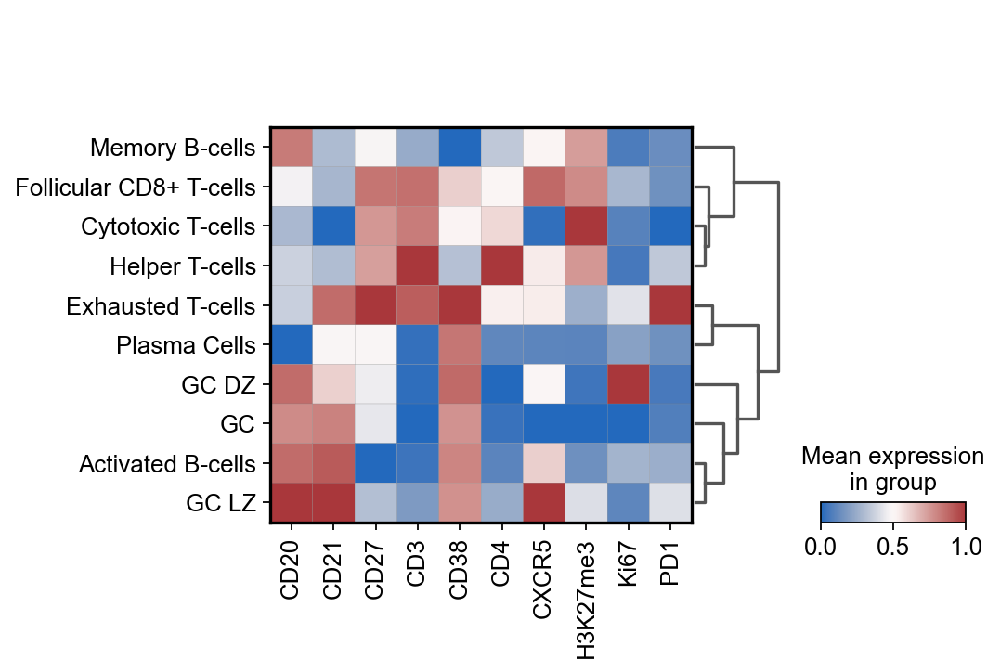

In [132]:
sc.tl.dendrogram(adata, groupby='Phenotype')
sc.pl.matrixplot(adata, var_names= adata.var.index, groupby='Phenotype', dendrogram=True, use_raw=False, cmap="vlag", standard_scale='var')


In [133]:
import matplotlib 

var = 'Phenotype'

cluster_label_order = adata.uns[f'dendrogram_{var}']['categories_ordered']

colors = adata.uns[f"{var}_colors"]
labels = adata.obs[var].cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}




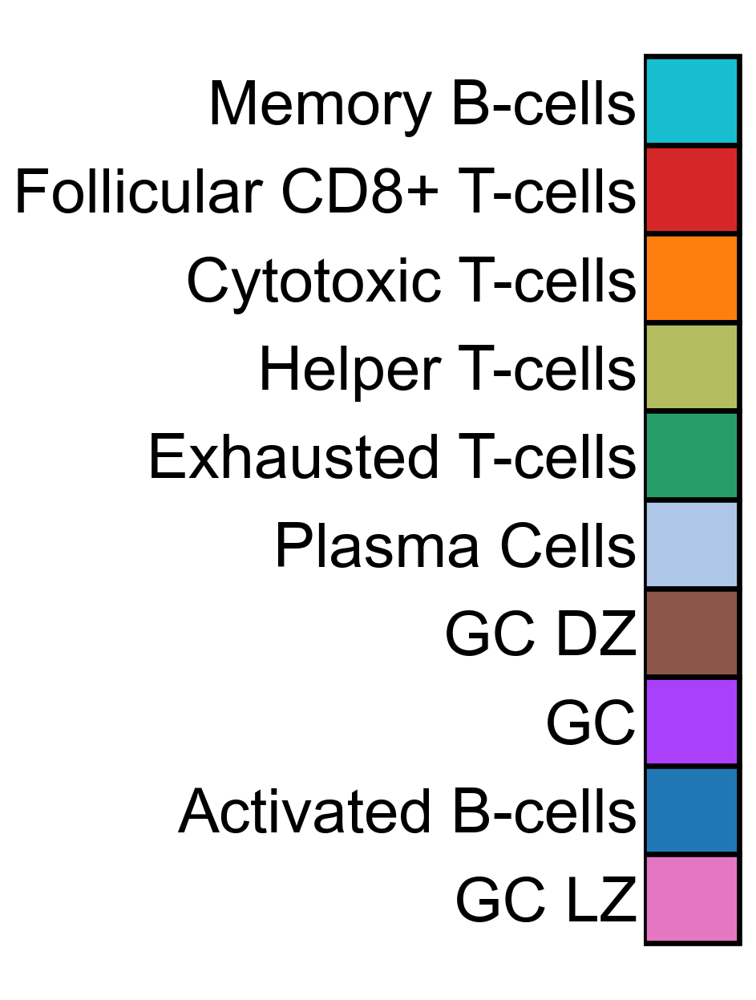

In [134]:
c=np.array([colors_rgb_dict[i] for i in cluster_label_order])

# legend
fig, ax = plt.subplots(figsize=(1,10))
ax.barh(y=range(len(colors_rgb_dict.values())), 
        color=c/255,
        width=1, 
        height=1,
        edgecolor='k',
        linewidth=3,
       )
_ = plt.yticks(range(len(colors_rgb_dict.values())), cluster_label_order, rotation=0, size=35)
_ = plt.xticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
# ax.yaxis.tick_right()
ax.invert_yaxis()
ax.grid(False)


## Spatial projection

In [135]:
from typing import List
import matplotlib
import skimage
from skimage import measure


def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]

    return img


def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

In [136]:
experiment = 'tonsil'
masks = get_masks(data_dir / "masks", f"{experiment}")

In [137]:
all_donor = ['DonorA_1',
 'DonorA_2',
 'DonorA_3',
 'DonorA_4',
 'DonorA_5',
 'DonorE_1',
 'DonorE_2',
 'DonorE_3',
 'DonorE_4',
 'DonorE_5',
 'DonorE_6']

donors = adata.obs.Core.unique()
donor_map = dict(zip([i for i in range(len(all_donor))], all_donor))

In [138]:
colors = adata.uns["Phenotype_colors"]
labels = adata.obs.Phenotype.cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

0


  0%|          | 0/10 [00:00<?, ?it/s]

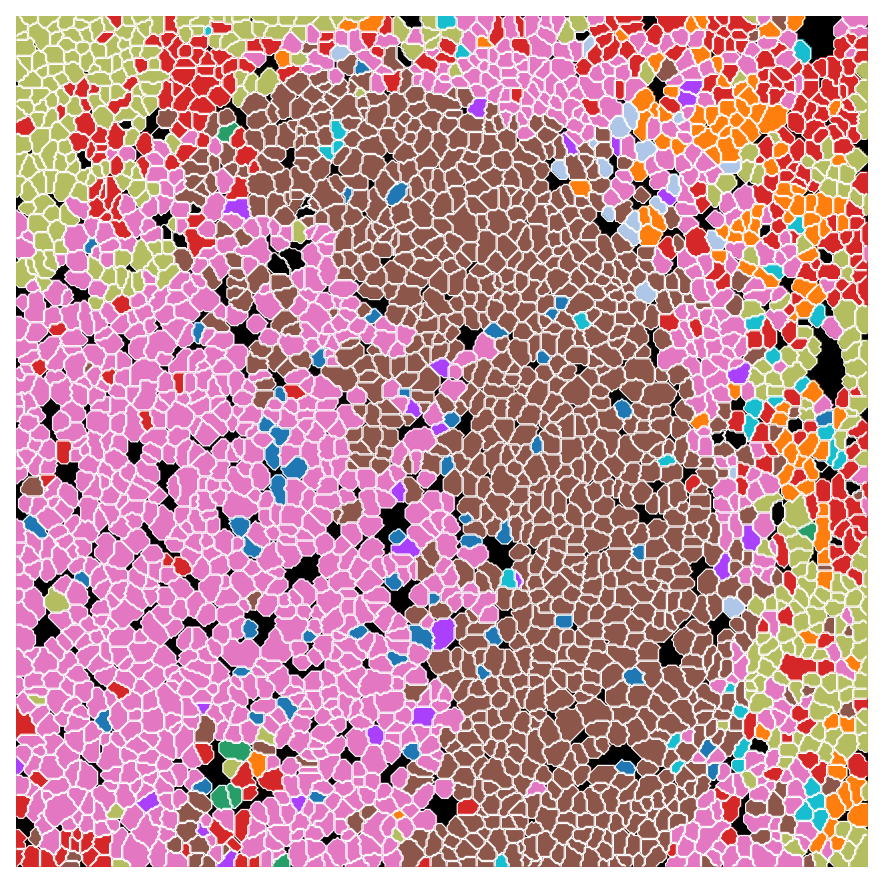

1


  0%|          | 0/10 [00:00<?, ?it/s]

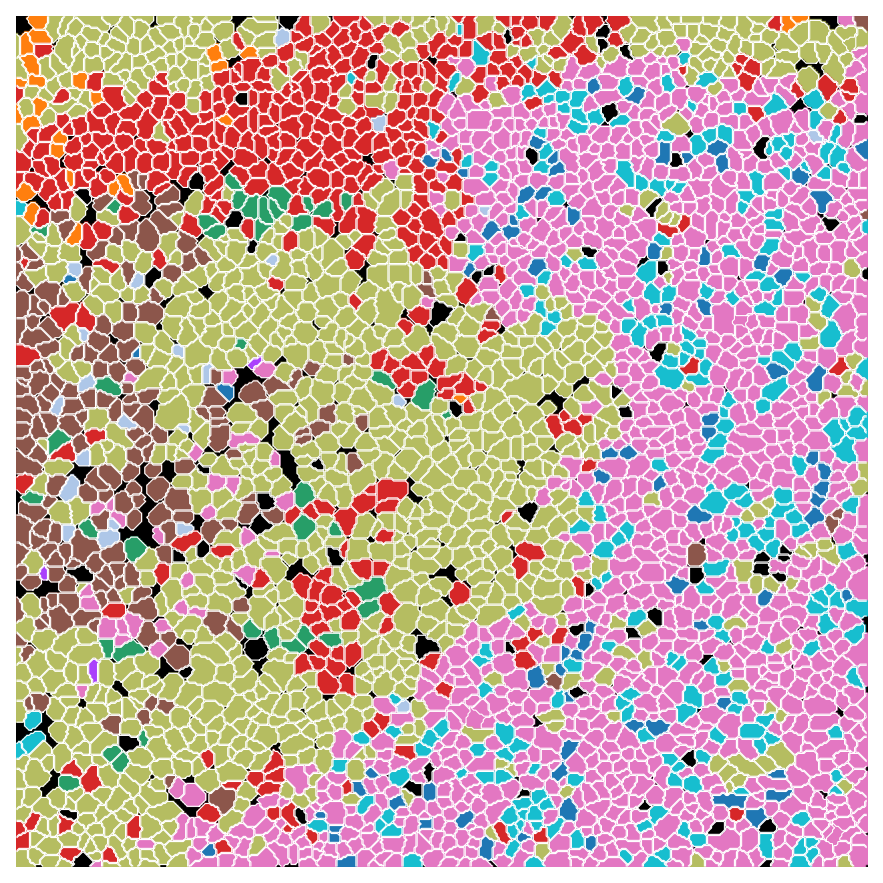

2


  0%|          | 0/10 [00:00<?, ?it/s]

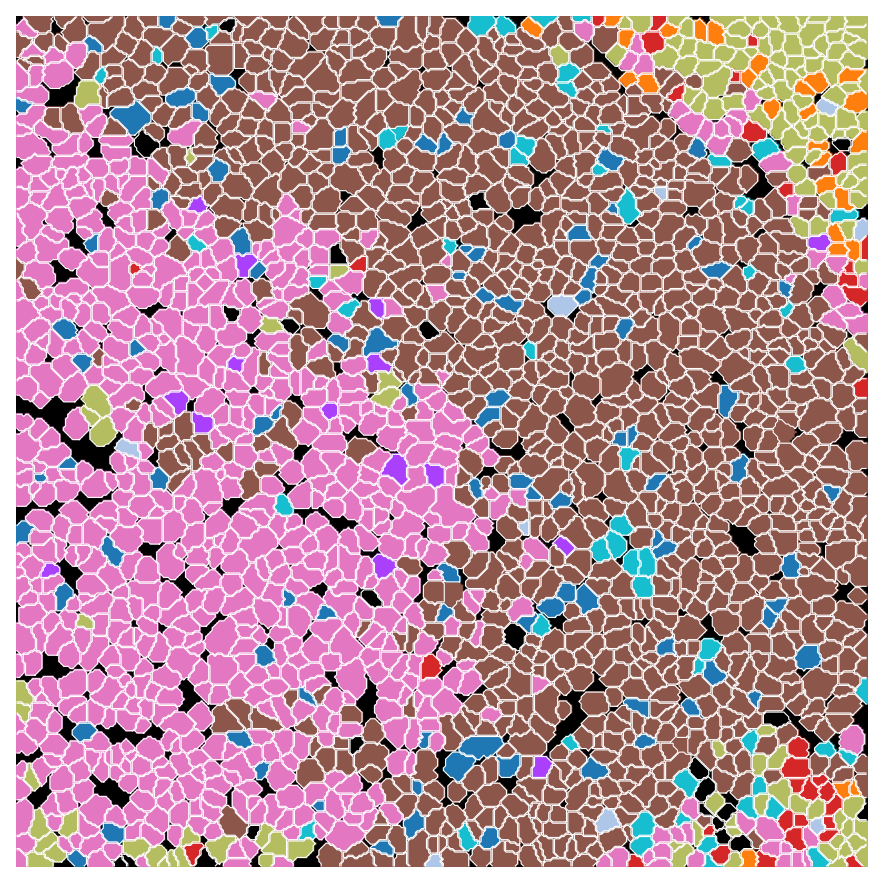

3


  0%|          | 0/10 [00:00<?, ?it/s]

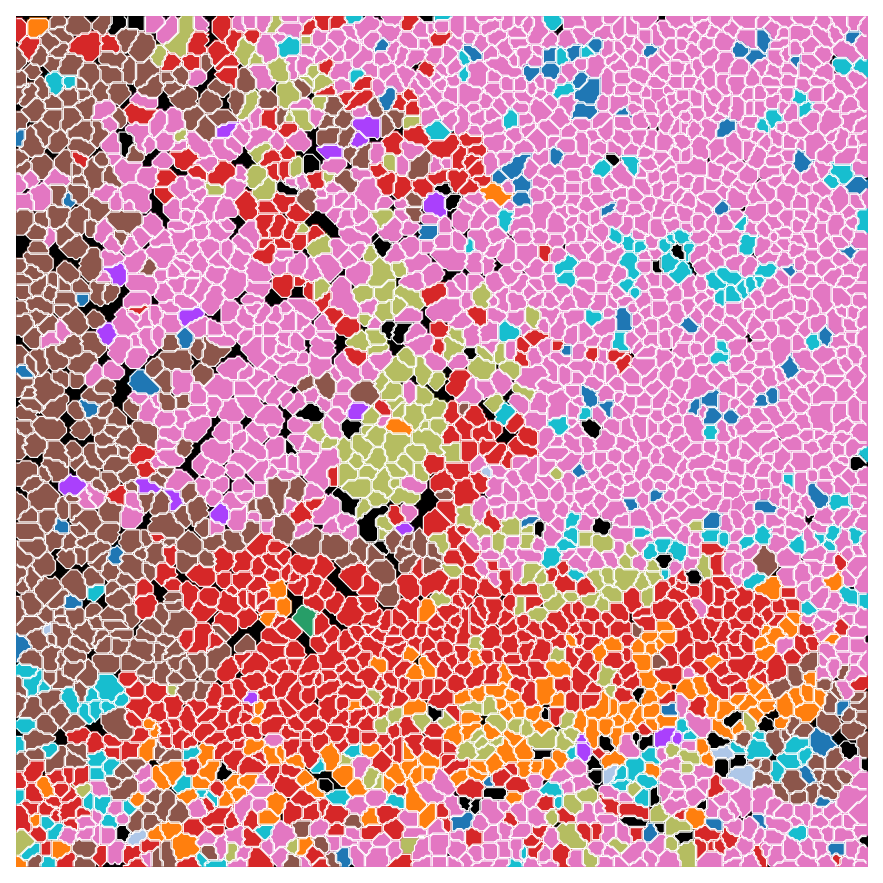

4


  0%|          | 0/10 [00:00<?, ?it/s]

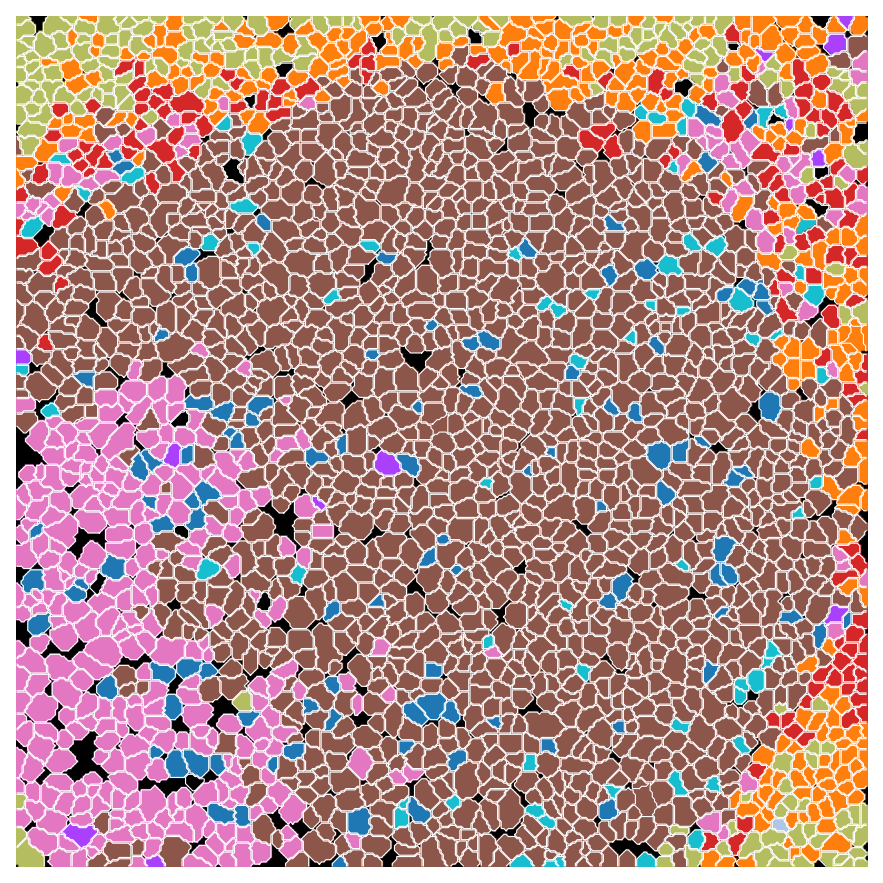

5


  0%|          | 0/10 [00:00<?, ?it/s]

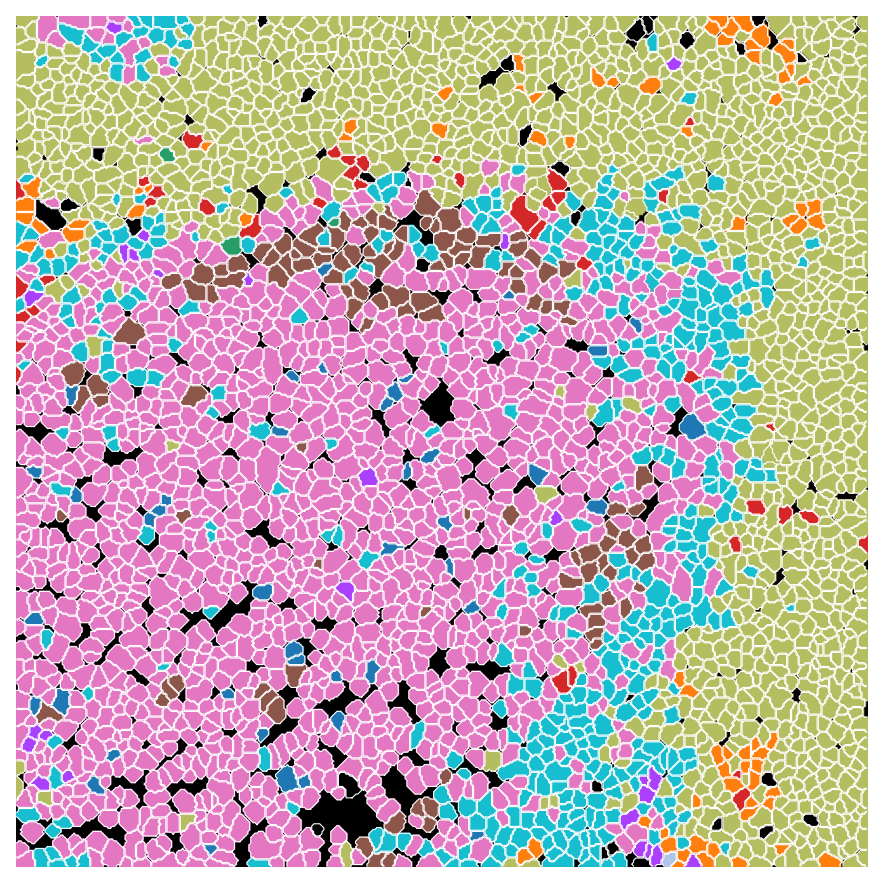

6


  0%|          | 0/10 [00:00<?, ?it/s]

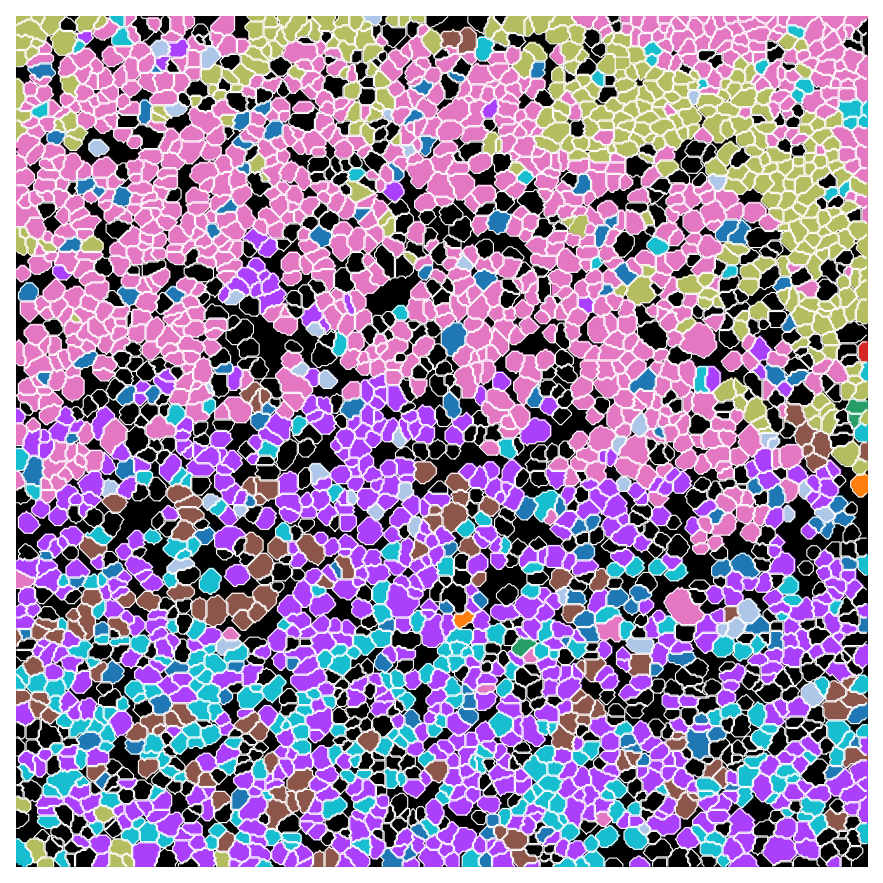

7


  0%|          | 0/10 [00:00<?, ?it/s]

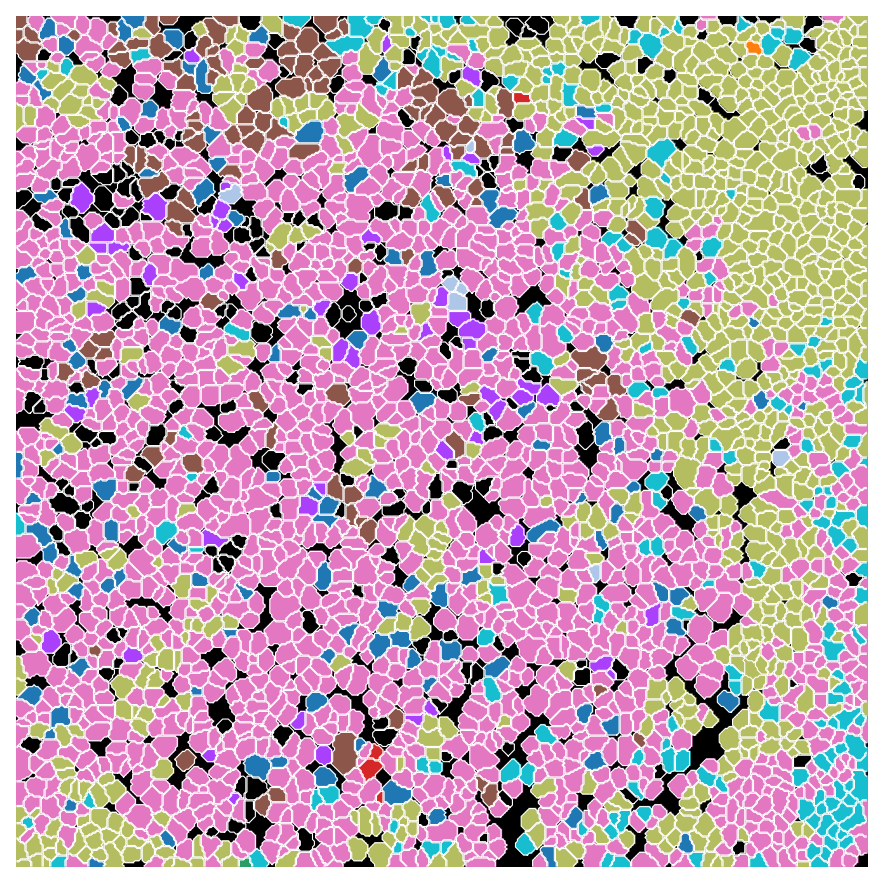

8


  0%|          | 0/10 [00:00<?, ?it/s]

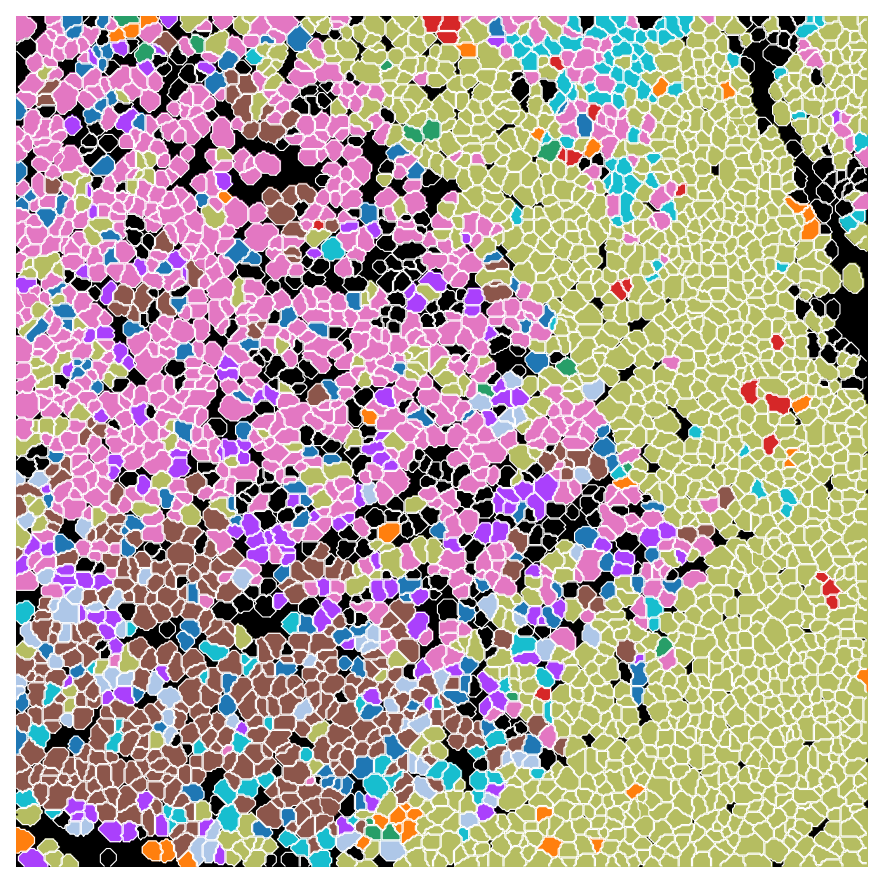

9


  0%|          | 0/10 [00:00<?, ?it/s]

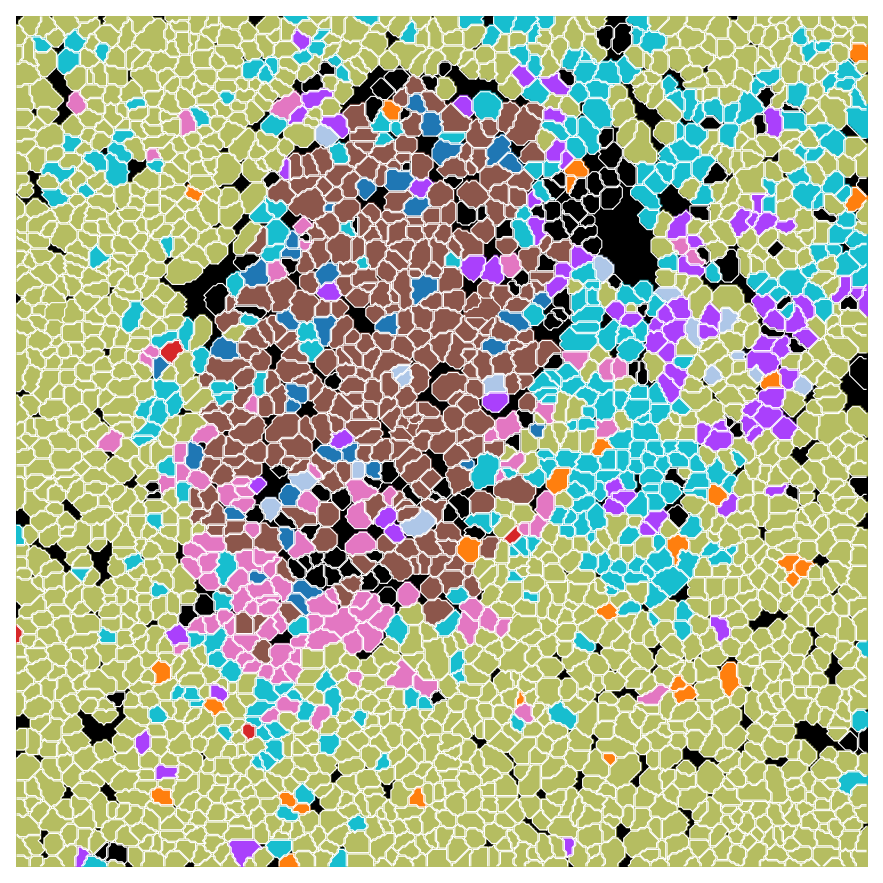

10


  0%|          | 0/10 [00:00<?, ?it/s]

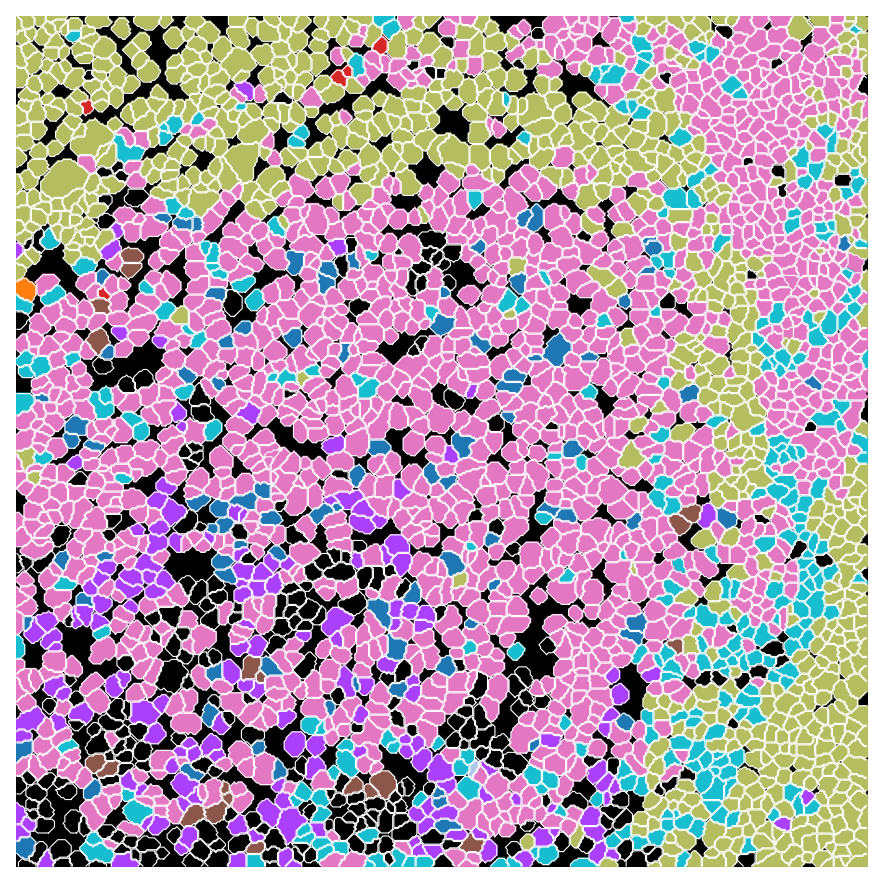

In [139]:
for dataset in adata.obs.Core.unique():
    print(dataset)
    adata_subset = adata[adata.obs.Core == dataset, :]
    mask = masks["_".join([experiment, donor_map[dataset]])]
    contours = get_contour(mask)

    # Get label2cell dict
    label2cell = {}
    for j, l in enumerate(labels):
        cell_id = adata_subset[adata_subset.obs.Phenotype == l].obs.Cell.to_list()
        label2cell[j] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(img)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
    plt.show()